# **Latar Belakang**

> Perusahaan ABCXYZ adalah salah satu perusahaan sekuritas di Amerika Serikat, yang saat ini sedang berfokus pada peningkatan *Brand Awareness*. <br><br>
Direktur Marketing memberikan project kepada divisi-divisi terkait sebagai salah satu strategi untuk mencapai tujuan tersebut. Salah satu tugasnya adalah dengan membuat video dalam official channel perusahaannya menembus trending di YouTube paling lambat 3 bulan dari video diunggah.<br><br>Oleh karena itu, salah satu Data Scientist dalam perusahaan tersebut ditugaskan untuk melakukan analisis mengenai apa-apa saja yang perlu dilakukan untuk mengoptimalkan peluang video di official channel YouTube perusahaan menjadi *trending*. Hasil dari analisis ini akan dipresentasikan kepada Direktur Marketing dan juga kepada Tim Creative untuk diimplementasikan.

## **Pernyataan Masalah**

> 1. Bagaimana gambaran umum mengenai Trending YouTube secara keseluruhan maupun secara periodik?
> 2. Apa saja variabel yang harus diperhatikan untuk mengoptimalkan peluang video muncul di Trending YouTube?
> 3. Apa saja *insights* dan *actionable recommendations* yang didapatkan dari analisis ini?

# **Data**

Pertama, saya import dataset YouTube Trending Video Statistics (US Only) menjadi dataframe "df".

In [2]:
import pyforest
df = pd.read_csv('USvideos.csv')

<IPython.core.display.Javascript object>

Langkah selanjutnya, saya ingin mendapatkan:<br>
  >  1. Gambaran data dengan melihat sampel nama kolom dan isi dalam barisnya <br>
   > 2. Ringkasan tipe data dari setiap kolom <br>
    >3. Data hilang *(missing value)* <br>
    >4. Statistika deskriptif kolom-kolom numerik<br>
    >5. Statistika deskriptif kolom-kolom non-numerik

In [3]:
df

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,BZt0qjTWNhw,18.14.06,The Cat Who Caught the Laser,AaronsAnimals,15,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,2657,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals
40945,1h7KV2sjUWY,18.14.06,True Facts : Ant Mutualism,zefrank1,22,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,3936,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN
40946,D6Oy4LfoqsU,18.14.06,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,24,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,3992,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...
40947,oV0zkMe1K8s,18.14.06,How Black Panther Should Have Ended,How It Should Have Ended,1,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,13088,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...


Dengan memanggil dataframe, secara otomatis akan ditampilkan sampel 5 data teratas *(head)* dan 5 data terbawah *(tail)*.

Dari sampel di atas, informasi yang saya dapatkan dari setiap kolom, sebagai berikut:  <br><br>
    - `video_id` : id unik video yang membedakan video satu dengan lainnya<br>
    - `trending_date` : tanggal video tersebut muncul di list Trending YouTube<br>
    - `title` : judul video, yang biasanya diklik pengguna (user) ketika ingin menonton video tersebut<br>
    - `channel_title` : nama channel pembuat video (YouTuber)<br>
    - `category_id` : kode numerik dari kategori video (ada file terpisah)<br>
    - `publish_time` : tanggal dan jam video diunggah oleh pembuat video <br>
    - `tags` : kata kunci dalam video yang dapat membantu pengguna menemukan video tersebut <br>
    - `views` : angka yang menunjukkan berapa kali video diputar oleh seluruh pengguna, angka ini tidak unik karena setiap pengguna yang menonton lebih dari satu kali akan dihitung apa adanya <br>
    - `likes` : angka yang menunjukkan berapa pengguna yang mengklik button 'I Like This' pada video tersebut, angka ini bersifat unik <br>
    - `dislikes` : angka yang menunjukkan berapa pengguna yang mengklik button 'I Dislike This' pada video tersebut, angka ini bersifat unik <br>
    - `comment_count` : jumlah komentar pada video, angka ini tidak unik karena setiap pengguna yang memberikan komentar lebih dari satu kali akan dihitung apa adanya <br>
    - `thumbnail_link` : link URL untuk melihat gambar thumbnail video <br>
    - `comments_disabled` : keterangan yang menunjukkan apakah video dapat diberikan komentar (True) atau tidak dapat diberikan komentar (False) oleh pengguna, yang diatur oleh pembuat Video <br>
    - `ratings_disabled` : keterangan yang menunjukkan apakah video dapat diberikan Like atau Dislike (True) atau tidak dapat diberikan Like atau Dislike (False) oleh pengguna, yang diatur oleh pembuat Video <br>
    - `video_error_or_removed` : keterangan yang menunjukkan apakah video tidak dapat diputar atau dihapus (True), atau video masih ada dan dapat diputar (False) <br>
    - `description` : teks yang dapat diketik oleh pembuat video untuk mendeskripsikan kontennya

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                40949 non-null  object
 1   trending_date           40949 non-null  object
 2   title                   40949 non-null  object
 3   channel_title           40949 non-null  object
 4   category_id             40949 non-null  int64 
 5   publish_time            40949 non-null  object
 6   tags                    40949 non-null  object
 7   views                   40949 non-null  int64 
 8   likes                   40949 non-null  int64 
 9   dislikes                40949 non-null  int64 
 10  comment_count           40949 non-null  int64 
 11  thumbnail_link          40949 non-null  object
 12  comments_disabled       40949 non-null  bool  
 13  ratings_disabled        40949 non-null  bool  
 14  video_error_or_removed  40949 non-null  bool  
 15  de

In [5]:
print('Jumlah missing value di setiap kolom :')
print(df.isna().sum())
print('\nJumlah missing value dari semua kolom: ', df.isna().sum().sum())

Jumlah missing value di setiap kolom :
video_id                    0
trending_date               0
title                       0
channel_title               0
category_id                 0
publish_time                0
tags                        0
views                       0
likes                       0
dislikes                    0
comment_count               0
thumbnail_link              0
comments_disabled           0
ratings_disabled            0
video_error_or_removed      0
description               570
dtype: int64

Jumlah missing value dari semua kolom:  570


In [6]:
df.describe()

,category_id,views,likes,dislikes,comment_count
count,40949.000000,4.094900e+04,4.094900e+04,4.094900e+04,4.094900e+04
mean,19.972429,2.360785e+06,7.426670e+04,3.711401e+03,8.446804e+03
std,7.568327,7.394114e+06,2.288853e+05,2.902971e+04,3.743049e+04
min,1.000000,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,17.000000,2.423290e+05,5.424000e+03,2.020000e+02,6.140000e+02
50%,24.000000,6.818610e+05,1.809100e+04,6.310000e+02,1.856000e+03
75%,25.000000,1.823157e+06,5.541700e+04,1.938000e+03,5.755000e+03
max,43.000000,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06


In [7]:
df.describe(include=object)

,video_id,trending_date,title,channel_title,publish_time,tags,thumbnail_link,description
count,40949,40949,40949,40949,40949,40949,40949,40379
unique,6351,205,6455,2207,6269,6055,6352,6901
top,j4KvrAUjn6c,17.14.11,WE MADE OUR MOM CRY...HER DREAM CAME TRUE!,ESPN,2018-05-18T14:00:04.000Z,[none],https://i.ytimg.com/vi/j4KvrAUjn6c/default.jpg,► Listen LIVE: http://power1051fm.com/\n► Face...
freq,30,200,30,203,50,1535,30,58


Dari data di atas, gambaran yang saya dapatkan: <br>
1. Terdapat 16 kolom dan 40.949 baris <br>
2. Tipe data terdiri dari 3 kolom boolean, 5 kolom numerik, dan 8 kolom non-numerik/object. <br>
3. Kolom `trending_date` dan `publish_time` belum berformat datetime. <br>
4. Hanya ada satu kolom yang terdapat missing value di dalamnya yaitu kolom `Description`  dengan jumlah 570. <br>
5. Semua kolom numerik memiliki angka 'mean' yang tidak sama dengan 'median', bahkan sekilas terlihat berbeda jauh. <br>
6. Dari 40.949 video yang pernah ada di list Trending YouTube, ternyata video uniknya hanya 6.351, dapat diasumsikan bahwa video di YouTube dapat berada dalam list Trending YouTube lebih dari satu kali. <br>
7. Video dengan judul 'WE MADE OUR MOM CRY...HER DREAM CAME TRUE!' dari channel ESPN muncul sebanyak 30 kali di list Trending YouTube. <br>
8. Jumlah unik `video_id` sebanyak 6.351 tetapi berbeda dengan jumlah unik `channel_title`, dapat diasumsikan bahwa video tersebut berhasil masuk ke dalam list Trending YouTube lebih dari satu kali. tetapi ada perubahan judul. <br>
9. Perlu ada data tambahan yang berkaitan dengan `category_id` karena data numerik tersebut hanyalah sebagai simbol dari data kategori video yang sebenarnya kategorikal.

## **Pembersihan & Manipulasi Data**

Setelah mengetahui gambaran dari data, langkah selanjutnya adalah: <br>
1. Menghapus data duplikat <br>
2. Mengidentifikasi dan menghapus kolom-kolom yang tidak perlu dianalisis <br>
3. Mengidentifikasi dan mengubah tipe data sesuai relevansinya <br>
4. Menindaklanjuti data hilang/missing value <br>
5. Mengidentifikasi dan menindaklanjuti anomali

### **1. Menghapus Data Duplikat**

In [8]:
len(df)-len(df.drop_duplicates())

48

Dengan code di atas, hasil menunjukkan bahwa terdapat `48 data duplikat`dari 40.949 data dalam dataframe. <br>
Kemudian, saya akan menghapus data duplikat dan menjadikannya permanen dalam dataframe.

In [9]:
df.drop_duplicates(inplace=True)

In [10]:
df.shape

(40901, 16)

Setelah menghapus data duplikat, sekarang data menjadi `40.901 baris`.

### **2. Mengidentifikasi dan menghapus kolom-kolom yang tidak perlu dianalisis**

Pertama, mengidentifikasi kolom-kolom yang tidak dapat dianalisis dan juga yang tidak relevan dengan pertanyaan penelitian, antara lain: <br>
- `video id` : karena hanya berisi ID unik dari setiap video <br>
- `thumbnail_link` : karena hanya berisi link untuk gambar thumbnail video <br>
- `video_error_or_removed` : karena hanya menunjukkan keterangan video error atau dihapus <br>
- `description` : karena tidak semua pembuat video membuat Description dan hanya berisi keterangan konten, isinya bisa kosong atau bahkan bisa sangat panjang sekali <br> <br>

Oleh karena itu, saya memutuskan untuk menghapus kolom-kolom irelevan tersebut secara permanen.

In [11]:
df.drop(['video_id','thumbnail_link', 'video_error_or_removed', 'description'], axis=1, inplace=True)

In [12]:
df.shape

(40901, 12)

Dengan menghapus 4 kolom yang irelevan, sekarang hanya terdapat `12 kolom` saja.

### **3. Mengidentifikasi dan mengubah tipe data sesuai relevansinya**

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40901 entries, 0 to 40948
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   trending_date      40901 non-null  object
 1   title              40901 non-null  object
 2   channel_title      40901 non-null  object
 3   category_id        40901 non-null  int64 
 4   publish_time       40901 non-null  object
 5   tags               40901 non-null  object
 6   views              40901 non-null  int64 
 7   likes              40901 non-null  int64 
 8   dislikes           40901 non-null  int64 
 9   comment_count      40901 non-null  int64 
 10  comments_disabled  40901 non-null  bool  
 11  ratings_disabled   40901 non-null  bool  
dtypes: bool(2), int64(5), object(5)
memory usage: 3.5+ MB


Dari 12 kolom yang tersisa, terdapat beberapa kolom yang tipenya belum tepat, antara lain:
1. `trending_date` seharusnya tipe DateTime karena menunjukkan tanggal video muncul di list Trending YouTube. <br>
2. `publish_time` juga seharusnya DateTime karena menunjukkan tanggal video diunggah. <br>
3. `category_id` diubah menjadi string karena sejatinya bukanlah angka numerik yang bisa dijelaskan secara statistika deskriptif.<br><br>

Ada 3 kolom yang tipenya perlu diperbaiki, 9 kolom lainnya sudah tepat.

Untuk kolom `trending_date` karena format tahunnya belum benar, maka ditambahkan terlebihd dahulu string '20' ke kolom `trending_date`.

In [14]:
df['trending_date'] = ['20'] + df['trending_date']

Kemudian, saya ubah tipenya menjadi DateTime dengan catatan bahwa kolom tersebut berformat "%Y.%d.%m".

In [15]:
df['trending_date'] = pd.to_datetime(df['trending_date'], format = "%Y.%d.%m")

<IPython.core.display.Javascript object>

In [16]:
print(df.info())
display(df)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40901 entries, 0 to 40948
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   trending_date      40901 non-null  datetime64[ns]
 1   title              40901 non-null  object        
 2   channel_title      40901 non-null  object        
 3   category_id        40901 non-null  int64         
 4   publish_time       40901 non-null  object        
 5   tags               40901 non-null  object        
 6   views              40901 non-null  int64         
 7   likes              40901 non-null  int64         
 8   dislikes           40901 non-null  int64         
 9   comment_count      40901 non-null  int64         
 10  comments_disabled  40901 non-null  bool          
 11  ratings_disabled   40901 non-null  bool          
dtypes: bool(2), datetime64[ns](1), int64(5), object(4)
memory usage: 3.5+ MB
None


,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,False,False
1,2017-11-14,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,False,False
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,False,False
3,2017-11-14,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,False,False
4,2017-11-14,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
40944,2018-06-14,The Cat Who Caught the Laser,AaronsAnimals,15,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,2657,False,False
40945,2018-06-14,True Facts : Ant Mutualism,zefrank1,22,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,3936,False,False
40946,2018-06-14,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,24,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,3992,False,False
40947,2018-06-14,How Black Panther Should Have Ended,How It Should Have Ended,1,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,13088,False,False


Dapat dilihat bahwa tipe dan format kolom `trending_date` sekarang sudah benar. <br> <br>

Kemudian, saya akan mengubah tipe kolom `publish_time` menjadi DateTime dan mengekstrasi tanggal serta jamnya. <br>

In [17]:
df['publish_time'] = pd.to_datetime(df['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')

<IPython.core.display.Javascript object>

In [18]:
print(df.info())
display(df.head())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40901 entries, 0 to 40948
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   trending_date      40901 non-null  datetime64[ns]
 1   title              40901 non-null  object        
 2   channel_title      40901 non-null  object        
 3   category_id        40901 non-null  int64         
 4   publish_time       40901 non-null  datetime64[ns]
 5   tags               40901 non-null  object        
 6   views              40901 non-null  int64         
 7   likes              40901 non-null  int64         
 8   dislikes           40901 non-null  int64         
 9   comment_count      40901 non-null  int64         
 10  comments_disabled  40901 non-null  bool          
 11  ratings_disabled   40901 non-null  bool          
dtypes: bool(2), datetime64[ns](2), int64(5), object(3)
memory usage: 3.5+ MB
None


,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13 17:13:01,SHANtell martin,748374,57527,2966,15954,False,False
1,2017-11-14,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13 07:30:00,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,False,False
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12 19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,False,False
3,2017-11-14,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13 11:00:04,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,False,False
4,2017-11-14,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12 18:01:41,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,False,False


Kolom `category_id` diubah menjadi string (object).

In [19]:
df['category_id'] = df['category_id'].astype(str)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40901 entries, 0 to 40948
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   trending_date      40901 non-null  datetime64[ns]
 1   title              40901 non-null  object        
 2   channel_title      40901 non-null  object        
 3   category_id        40901 non-null  object        
 4   publish_time       40901 non-null  datetime64[ns]
 5   tags               40901 non-null  object        
 6   views              40901 non-null  int64         
 7   likes              40901 non-null  int64         
 8   dislikes           40901 non-null  int64         
 9   comment_count      40901 non-null  int64         
 10  comments_disabled  40901 non-null  bool          
 11  ratings_disabled   40901 non-null  bool          
dtypes: bool(2), datetime64[ns](2), int64(4), object(4)
memory usage: 3.5+ MB


Sekarang, kolom `trending_date` dan `publish_time` sekarang sudah bertipe DateTime dan kolom `category_id` sudah menjadi string.

### **4. Menindaklanjuti data hilang/missing value**

In [21]:
df.isna().sum().sum()

0

Seperti yang sudah ditunjukkan sebelumnya, data kosong atau *missing value* hanya terdapat pada kolom `Description` dengan jumlah 570 data. Akan tetapi, karena kolom `Description` termasuk kolom yang irelevan sehingga kolom tersebut sudah dihapus. Dengan demikian, dalam dataframe yang sekarang sudah tidak ada lagi data kosong atau *missing value*.

### **5. Mengidentifikasi dan menindaklanjuti anomali**

Untuk mempermudah, saya akan menunjukkan kembali statistika deskriptif dari kolom-kolom numerik.

In [22]:
df.describe()

,views,likes,dislikes,comment_count
count,4.090100e+04,4.090100e+04,4.090100e+04,4.090100e+04
mean,2.360678e+06,7.427173e+04,3.711722e+03,8.448567e+03
std,7.397719e+06,2.289999e+05,2.904624e+04,3.745139e+04
min,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.419720e+05,5.416000e+03,2.020000e+02,6.130000e+02
50%,6.810640e+05,1.806900e+04,6.300000e+02,1.855000e+03
75%,1.821926e+06,5.533800e+04,1.936000e+03,5.752000e+03
max,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06


Jika dilihat ala kadarnya seperti yang sempat disebutkan di atas, dapat dilihat bahwa nilai "mean" dan "median" tidak sama, bahkan bisa dibilang berbeda jauh. Angka tersebut berhubungan dengan nilai "min" dan "max" yang sangat jauh juga karena "min" untuk kolom `likes`, `dislikes`, dan `comment_count` adalah 0. Hal ini disebabkan pada video, ketiga fitur tersebut bisa dinonaktifkan oleh pembuat video.<br>
Keterangan tersebut tertera pada kolom yang tipe datanya *boolean*, antara lain: <br>
    - `comments_disabled` : video diatur untuk tidak bisa menerima komentar apapun <br>
    - `ratings_disabled` : video tidak bisa diberikan *like* maupun *dislike* oleh pengguna atau penonton <br> 
<br>
Oleh karena itu, saya akan kembali memanggil syntax   *.describe()*   hanya untuk video-video yang `comment_disabled` dan `ratings_disabled` bernilai **False**.

In [23]:
print('Statistika Deskriptif hanya video-video yang mengaktifkan kolom komentar')
display(df[df['comments_disabled'] == False].describe())
print('Statistika Deskriptif hanya video-video yang mengaktifkan button Like dan Dislike')
display(df[df['ratings_disabled'] == False].describe())

Statistika Deskriptif hanya video-video yang mengaktifkan kolom komentar


,views,likes,dislikes,comment_count
count,4.026900e+04,4.026900e+04,4.026900e+04,4.026900e+04
mean,2.358176e+06,7.510092e+04,3.727791e+03,8.581163e+03
std,7.413731e+06,2.306512e+05,2.925857e+04,3.772906e+04
min,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.434700e+05,5.585000e+03,2.050000e+02,6.510000e+02
50%,6.810920e+05,1.826200e+04,6.330000e+02,1.912000e+03
75%,1.815481e+06,5.589800e+04,1.928000e+03,5.878000e+03
max,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06


Statistika Deskriptif hanya video-video yang mengaktifkan button Like dan Dislike


,views,likes,dislikes,comment_count
count,4.073200e+04,4.073200e+04,4.073200e+04,4.073200e+04
mean,2.353360e+06,7.457989e+04,3.727122e+03,8.481911e+03
std,7.375652e+06,2.294244e+05,2.910545e+04,3.752535e+04
min,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.427928e+05,5.514750e+03,2.060000e+02,6.200000e+02
50%,6.814335e+05,1.824650e+04,6.350000e+02,1.865500e+03
75%,1.823902e+06,5.568025e+04,1.947250e+03,5.785000e+03
max,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06


Dari data di atas dapat dilihat bahwa walaupun video **mengaktifkan kolom komentar**, bisa saja video trending itu tidak mendapatkan satupun komentar dari pengguna YouTube yang menonton video tersebut. Demikian pula dengan pada video yang **mengaktifkan Like and Dislike**, tetap ada saja video yang tidak mendapatkan Like maupun Dislike sama sekali.

>Untuk membuktikannya, saya akan menunjukkan sampel data video yang mengaktifkan kolom komentar tapi `comment_count`-nya bernilai 0.

In [24]:
df.loc[(df['comment_count'] == 0) & (df['comments_disabled'] == False)].head(3)

,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
160,2017-11-14,Huffy Metaloid Bicycle Commercial 1997,90s Commercials,27,2017-03-31 21:46:53,"90s commercials|""Huffy""",773,2,0,0,False,False
192,2017-11-14,Apple Clips sample,Steve Kovach,22,2017-11-09 18:01:04,[none],2259,0,0,0,False,False
284,2017-11-15,"Joel Embiid on win over Clippers, scuffle with...",NBA on ESPN,17,2017-11-14 15:20:12,"nba|""basketball""|""espn""|""nba video""|""nba inter...",5813,33,3,0,False,False


> Juga untuk sampel data video yang mengaktifkan Like dan Dislike tetapi `likes` maupun `dislikes`-nya bernilai 0.

In [25]:
df.loc[(df['likes'] == 0) & (df['dislikes'] == 0) & (df['ratings_disabled'] == True)].head(3)

,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
1435,2017-11-21,Breaking Bad's Bryan Cranston on Meeting Charl...,hudsonunionsociety,1,2016-10-14 21:14:51,"Breaking Bad|""Bryan Cranston""|""malcom in the m...",15058,0,0,0,True,True
1667,2017-11-22,Breaking Bad's Bryan Cranston on Meeting Charl...,hudsonunionsociety,1,2016-10-14 21:14:51,"Breaking Bad|""Bryan Cranston""|""malcom in the m...",34207,0,0,0,True,True
1868,2017-11-23,Highlights of the EA predatory behavior announ...,chris lee,22,2017-11-21 19:29:03,[none],160012,0,0,1722,False,True


Menariknya, ada pula video yang **menonaktifkan kolom komentar, sekaligus pula menonaktifkan button Like dan Dislike** tetapi masuk list Trending YouTube.

In [26]:
print(('Jumlah video : '), df.loc[(df['comments_disabled'] == True) & (df['ratings_disabled'] == True)]['title'].count())

display(df.loc[(df['comments_disabled'] == True) & (df['ratings_disabled'] == True)].head(3))

Jumlah video :  106


,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
1435,2017-11-21,Breaking Bad's Bryan Cranston on Meeting Charl...,hudsonunionsociety,1,2016-10-14 21:14:51,"Breaking Bad|""Bryan Cranston""|""malcom in the m...",15058,0,0,0,True,True
1667,2017-11-22,Breaking Bad's Bryan Cranston on Meeting Charl...,hudsonunionsociety,1,2016-10-14 21:14:51,"Breaking Bad|""Bryan Cranston""|""malcom in the m...",34207,0,0,0,True,True
1914,2017-11-23,Breaking Bad's Bryan Cranston on Meeting Charl...,hudsonunionsociety,1,2016-10-14 21:14:51,"Breaking Bad|""Bryan Cranston""|""malcom in the m...",36137,0,0,0,True,True


Dari pemaparan di atas untuk kolom `likes`, `dislikes`, dan `comment_count`, saya menganggap bahwa seluruh data tersebut adalah representasi dari dataset Trending YouTube List ini. Walaupun angka minimum dan maksimumnya rentangnya sangat lebar dan sangat beragam, fakta tersebut dapat dikatakan wajar terjadi mengingat konteksnya adalah reaksi pengguna YouTube terhadap suatu konten video.

Sedangkan untuk kolom `views` saya akan menampilkan nilai minimum dan maksimumnya terlebih dahulu.

In [27]:
print('Angka views video minimum :', df['views'].min())
print('Angka views video maksimum :', df['views'].max())

Angka views video minimum : 549
Angka views video maksimum : 225211923


Dapat dilihat bahwa terjadi rentang yang sangat besar antara angka views paling sedikit 549 dan views paling banyak mencapai 225 juta. Tentu ini menjadi pertanyaan bahwa angka 549 bisa dibilang sangat kecil untuk termasuk ke dalam List Trending YouTube. Sehingga pertanyaannya adalah apakah angka ini termasuk anomali? <br><br>
Saya mencoba *search* fakta-fakta mengenai Trending YouTube.<br>
>Dari situs resmi Google menyatakan bahwa pertimbangan video akan masuk trending, antara lain: <br>
    - angka views <br>
    - seberapa cepat video menghasilkan views <br>
    - dari mana saja sumber views, termasuk pengguna dari luar YouTube <br>
    - usia video (rentang dari video tersebut diunggah sampai per hari tersebut) <br>
    - performa video dibandingkan dengan video-video yang diunggah dalam channel yang sama <br><br>
    Selengkapnya dapat dilihat di tautan ini https://support.google.com/youtube/answer/7239739?hl=en<br><br>

Dari info tersebut kembali menimbulkan pertanyaan bagi saya
> "jika angka views itu sangat penting, mengapa bisa ada video dengan 549 views saja bisa masuk trending?"

Saya kira dalam dataset ini terdapat data yang salah. Akan tetapi, ketika saya mencari info lanjutan, ternyata memang ada video dengan views 500-an saja sudah muncul di List Trending YouTube. <br>
Bukti dapat dilihat di tautan ini https://www.reddit.com/r/YouTube/comments/6qwku3/how_is_a_video_with_500_views_trending/?rdt=44861 

> Informasi menarik ini dapat didukung juga oleh informasi pada tautan pertama. Google menyatakan bahwa angka views memang salah satu pertimbangan, akan tetapi ada pertimbangan lain yaitu: <br>
    - video dapat menjangkau pengguna YouTube secara luas <br>
    - konten tidak menyesatkan, tidak *clickbaity*, dan tidak sensasional <br>
    - konten mencerminkan apa yang sedang *hype* di YouTube dan di dunia <br>
    - merepresentasikan keberagaman seluruh pembuat video <br>
    - konten yang mengejutkan dan baru <br>
    <br>
Dari rincian informasi di atas, dapat disimpulkan bahwa angka views dengan rentang yang sangat besar adalah keberagaraman data saja. Seluruh angka yang ada adalah representasi dari dataset Trending YouTube ini sehingga tidak ada data yang dinyatakan anomali.

Selanjutnya, saya akan menambahkan kolom-kolom yang akan memperkaya analisis penelitian, sebagai berikut: <br>
1. `title_length` : angka yang menunjukkan jumlah karakter judul video <br>
2. `title_all_capitalized` : keterangan *boolean* yang menunjukkan apakah judul video mengandung huruf KAPITAL semua (True) atau judul dengan campuran kapital dan non-kapital atau semuanya non-kapital (False). <br>
    Contoh:
    - EXTREME GOLDEN TAN TRANSFORMATION `[TRUE]`
    - California Fire Forces Thousands to Evacuate `[FALSE]`
    - the ocean currents brought us in a lovely gift today `[FALSE]`
3. `category` : deskripsi kategori berdasarkan `category_id` menggunakan dataset tambahan <br>
4. `count_of_hashtags` :  angka yang menunjukkan banyaknya tagar atau *hashtag* pada video <br>
5. `publish_to_trending` : interval dalam satuan hari dari tanggal video diunggah sampai video tersebut muncul di Trending YouTube <br>
6. `publish_day` : nama hari (Senin-Minggu) saat video diunggah<br>
7. `publish_hour` : waktu/jam (00-24) saat video diunggah <br>

Kolom-kolom di atas adalah data-data tambahan yang akan saya gunakan untuk memperkaya jawaban permasalahan. Detailnya akan dipaparkan dalam bagian Analisis Data.

1. `title_length`

In [28]:
df['title_length'] = df['title'].str.len()

2. `title_all_capitalized`

In [29]:
def all_capitalized(s):
    for i in s:
        if s.isupper():
            return True
    return False

df["title_all_capitalized"] = df["title"].apply(all_capitalized)

3. `category`

Langkah pertama yang harus dilakukan adalah mengimport datasetnya terlebih dahulu.

In [30]:
dfCategory = pd.read_json('US_category_id.json')
dfCategory.head()

<IPython.core.display.Javascript object>

,kind,etag,items
0,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
1,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
2,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
3,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
4,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."


Untuk mengetahui data `category_id` berada di kolom mana, saya akan menampilkan data baris pertama secara **penuh** dari setiap kolom.

In [31]:
#kolom `kind`
print(pd.set_option("max_colwidth", None),
dfCategory['kind'].head(1))

#kolom `etag`
print(pd.set_option("max_colwidth", None),
dfCategory['etag'].head(1))

#kolom `items`
print(pd.set_option("max_colwidth", None),
dfCategory['items'].head(1))

<IPython.core.display.Javascript object>

None 0    youtube#videoCategoryListResponse
Name: kind, dtype: object


<IPython.core.display.Javascript object>

None 0    "m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJvJAAShlR6hM"
Name: etag, dtype: object


<IPython.core.display.Javascript object>

None 0    {'kind': 'youtube#videoCategory', 'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/Xy1mB4_yLrHy_BmKmPBggty2mZQ"', 'id': '1', 'snippet': {'channelId': 'UCBR8-60-B28hp2BmDPdntcQ', 'title': 'Film & Animation', 'assignable': True}}
Name: items, dtype: object


Dari data di atas, dapat diketahui bahwa keterangan category terdapat dalam kolom **`items`** dengan nomor kategori pada `id` dan deskripsi kategori di dalam `title`. <br><br>

Selanjutnya, saya akan melakukan proses seperti *LookUp di Microsoft Excel* untuk memasukkan deskripsi kategori dalam dataframe dengan syntax mapping. <br>

Pertama, di atas saya sudah mengubah `category_id` yang tadinya numerik menjadi string. <br>
Kemudian, membuat variabel baru yang akan menampung data deskripsi kategori dan menggunakan *for loop* untuk menyesuaikan deskripsi kategori dengan `category_id`.

In [32]:
id_category_name = {}
for i in dfCategory['items']:
    id_category_name[i['id']] = i['snippet']['title']

Selanjutnya, variabel baru akan saya mapping ke dalam dataframe dan langsung mengganti kolom `category_id` dengan deskripsi kategori dan saya ubah nama kolomnya menjadi `category` saja.

In [33]:
df['category_id'] = df['category_id'].map(id_category_name)


In [34]:
df.rename(columns={"category_id": "category"}, inplace=True)

In [35]:
df.head()

,trending_date,title,channel_title,category,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,title_length,title_all_capitalized
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,People & Blogs,2017-11-13 17:13:01,SHANtell martin,748374,57527,2966,15954,False,False,34,True
1,2017-11-14,The Trump Presidency: Last Week Tonight with John Oliver (HBO),LastWeekTonight,Entertainment,2017-11-13 07:30:00,"last week tonight trump presidency|""last week tonight donald trump""|""john oliver trump""|""donald trump""",2418783,97185,6146,12703,False,False,62,False
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Rudy Mancuso,Comedy,2017-11-12 19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""|""racist""|""superman""|""love""|""rudy mancuso poo bear black white official music video""|""iphone x by pineapple""|""lelepons""|""hannahstocking""|""rudymancuso""|""inanna""|""anwar""|""sarkis""|""shots""|""shotsstudios""|""alesso""|""anitta""|""brazil""|""Getting My Driver's License | Lele Pons""",3191434,146033,5339,8181,False,False,53,False
3,2017-11-14,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,Entertainment,2017-11-13 11:00:04,"rhett and link|""gmm""|""good mythical morning""|""rhett and link good mythical morning""|""good mythical morning rhett and link""|""mythical morning""|""Season 12""|""nickelback lyrics""|""nickelback lyrics real or fake""|""nickelback""|""nickelback songs""|""nickelback song""|""rhett link nickelback""|""gmm nickelback""|""lyrics (website category)""|""nickelback (musical group)""|""rock""|""music""|""lyrics""|""chad kroeger""|""canada""|""music (industry)""|""mythical""|""gmm challenge""|""comedy""|""funny""|""challenge""",343168,10172,666,2146,False,False,32,False
4,2017-11-14,I Dare You: GOING BALD!?,nigahiga,Entertainment,2017-11-12 18:01:41,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""idy""|""rhpc""|""dares""|""no truth""|""comments""|""comedy""|""funny""|""stupid""|""fail""",2095731,132235,1989,17518,False,False,24,False


Kolom `category` kini sudah tidak lagi numerik melainkan deskripsi kategori masing-masing video.

4. `count_of_hashtags`

In [36]:
print(pd.set_option("max_colwidth", None),
df['tags'].head(5))

<IPython.core.display.Javascript object>

None 0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  SHANtell martin
1                                                                                                                                                                                                                                                                                                                                                                                           last week tonight trump presidency|"last week tonight donald trump"|"john oliver trump"|"donald trump"
2                            

Berdasarkan 5 sampel data di atas, dapat dilihat bahwa banyaknya *hashtag* dipisahkan dengan tanda **___ "|" ___**. <br>
Oleh karena itu, saya menggunakan tanda tersebut sebagai perhitungan tetapi harus dibagi angka 2 karena satu *hashtag* diapit oleh dua tanda tersebut. Kemudian, saya ubah dari float ke integer karena `count_of_hashtags` adalah angka bulat.

In [37]:
df['count_of_hashtags'] = (df['tags'].str.count('"|"')/2).astype(np.int64)

<IPython.core.display.Javascript object>

In [38]:
df['count_of_hashtags'].info()
display(df.head(3))

<class 'pandas.core.series.Series'>
Int64Index: 40901 entries, 0 to 40948
Series name: count_of_hashtags
Non-Null Count  Dtype
--------------  -----
40901 non-null  int64
dtypes: int64(1)
memory usage: 639.1 KB


,trending_date,title,channel_title,category,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,title_length,title_all_capitalized,count_of_hashtags
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,People & Blogs,2017-11-13 17:13:01,SHANtell martin,748374,57527,2966,15954,False,False,34,True,0
1,2017-11-14,The Trump Presidency: Last Week Tonight with John Oliver (HBO),LastWeekTonight,Entertainment,2017-11-13 07:30:00,"last week tonight trump presidency|""last week tonight donald trump""|""john oliver trump""|""donald trump""",2418783,97185,6146,12703,False,False,62,False,3
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Rudy Mancuso,Comedy,2017-11-12 19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""|""racist""|""superman""|""love""|""rudy mancuso poo bear black white official music video""|""iphone x by pineapple""|""lelepons""|""hannahstocking""|""rudymancuso""|""inanna""|""anwar""|""sarkis""|""shots""|""shotsstudios""|""alesso""|""anitta""|""brazil""|""Getting My Driver's License | Lele Pons""",3191434,146033,5339,8181,False,False,53,False,21


Kolom `count_of_hashtags` baru sudah terdapat dalam dataframe yang menunjukkan jumlah *hashtags* dari masing-masing video.

5. `publish_to_trending`

Untuk membuat kolom ini, saya akan membuat variabel sementara untuk `publish_time` dan `trending_date` karena ada kolom yang berisi detail waktu (jam) tetapi kolom lainnya tidak. Perbedaan tersebut akan membuat interval hari menjadi minus. 

In [39]:
x = df['publish_time'].dt.date
y = df['trending_date'].dt.date

In [40]:
df['publish_to_trending'] = ((y-x)/pd.Timedelta('1 day')).astype(np.int64)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [41]:
df.head()

,trending_date,title,channel_title,category,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,title_length,title_all_capitalized,count_of_hashtags,publish_to_trending
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,People & Blogs,2017-11-13 17:13:01,SHANtell martin,748374,57527,2966,15954,False,False,34,True,0,1
1,2017-11-14,The Trump Presidency: Last Week Tonight with John Oliver (HBO),LastWeekTonight,Entertainment,2017-11-13 07:30:00,"last week tonight trump presidency|""last week tonight donald trump""|""john oliver trump""|""donald trump""",2418783,97185,6146,12703,False,False,62,False,3,1
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Rudy Mancuso,Comedy,2017-11-12 19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""|""racist""|""superman""|""love""|""rudy mancuso poo bear black white official music video""|""iphone x by pineapple""|""lelepons""|""hannahstocking""|""rudymancuso""|""inanna""|""anwar""|""sarkis""|""shots""|""shotsstudios""|""alesso""|""anitta""|""brazil""|""Getting My Driver's License | Lele Pons""",3191434,146033,5339,8181,False,False,53,False,21,2
3,2017-11-14,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,Entertainment,2017-11-13 11:00:04,"rhett and link|""gmm""|""good mythical morning""|""rhett and link good mythical morning""|""good mythical morning rhett and link""|""mythical morning""|""Season 12""|""nickelback lyrics""|""nickelback lyrics real or fake""|""nickelback""|""nickelback songs""|""nickelback song""|""rhett link nickelback""|""gmm nickelback""|""lyrics (website category)""|""nickelback (musical group)""|""rock""|""music""|""lyrics""|""chad kroeger""|""canada""|""music (industry)""|""mythical""|""gmm challenge""|""comedy""|""funny""|""challenge""",343168,10172,666,2146,False,False,32,False,26,1
4,2017-11-14,I Dare You: GOING BALD!?,nigahiga,Entertainment,2017-11-12 18:01:41,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""idy""|""rhpc""|""dares""|""no truth""|""comments""|""comedy""|""funny""|""stupid""|""fail""",2095731,132235,1989,17518,False,False,24,False,13,2


Sudah terdapat kolom baru `publish_to_trending` yang menunjukkan interval dalam satuan hari dari tanggal video diunggah sampai video tersebut muncul di list Trending YouTube.

6. `publish_day`

In [42]:
df['publish_day'] = df['publish_time'].dt.day_name()
df.head(3)

,trending_date,title,channel_title,category,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,title_length,title_all_capitalized,count_of_hashtags,publish_to_trending,publish_day
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,People & Blogs,2017-11-13 17:13:01,SHANtell martin,748374,57527,2966,15954,False,False,34,True,0,1,Monday
1,2017-11-14,The Trump Presidency: Last Week Tonight with John Oliver (HBO),LastWeekTonight,Entertainment,2017-11-13 07:30:00,"last week tonight trump presidency|""last week tonight donald trump""|""john oliver trump""|""donald trump""",2418783,97185,6146,12703,False,False,62,False,3,1,Monday
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Rudy Mancuso,Comedy,2017-11-12 19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""|""racist""|""superman""|""love""|""rudy mancuso poo bear black white official music video""|""iphone x by pineapple""|""lelepons""|""hannahstocking""|""rudymancuso""|""inanna""|""anwar""|""sarkis""|""shots""|""shotsstudios""|""alesso""|""anitta""|""brazil""|""Getting My Driver's License | Lele Pons""",3191434,146033,5339,8181,False,False,53,False,21,2,Sunday


7. `publish_hour`

In [43]:
df['publish_hour'] = (df['publish_time'].dt.hour).astype(object)
df.head(3)

,trending_date,title,channel_title,category,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,title_length,title_all_capitalized,count_of_hashtags,publish_to_trending,publish_day,publish_hour
0,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,People & Blogs,2017-11-13 17:13:01,SHANtell martin,748374,57527,2966,15954,False,False,34,True,0,1,Monday,17
1,2017-11-14,The Trump Presidency: Last Week Tonight with John Oliver (HBO),LastWeekTonight,Entertainment,2017-11-13 07:30:00,"last week tonight trump presidency|""last week tonight donald trump""|""john oliver trump""|""donald trump""",2418783,97185,6146,12703,False,False,62,False,3,1,Monday,7
2,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Rudy Mancuso,Comedy,2017-11-12 19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""|""racist""|""superman""|""love""|""rudy mancuso poo bear black white official music video""|""iphone x by pineapple""|""lelepons""|""hannahstocking""|""rudymancuso""|""inanna""|""anwar""|""sarkis""|""shots""|""shotsstudios""|""alesso""|""anitta""|""brazil""|""Getting My Driver's License | Lele Pons""",3191434,146033,5339,8181,False,False,53,False,21,2,Sunday,19


Kolom `publish_hour` sudah berhasil dibuat dalam skala 00 - 24.

Penambahan kolom-kolom baru sudah selesai dibuat. Sekarang akan saya lanjutkan ke tahap **Analisis Data**.

# **Analisis Data**

Pada tahap analisis data ini, akan di-*breakdown* menjadi beberapa kategori analisis, antara lain:

> 1. `Analisis Umum` : pemaparan jumlah video yang muncul di trending dalam skala bulanan dan juga Statistika Deskriptif secara umum. <br>
> 2. `Analisis Konten` : analisis video berdasarkan kategori, termasuk mengenai judul dan penggunaan tagar (*hashtag*) yang dikaitkan dengan jumlah video dan views yang terkait dengan setiap kategori. <br>
> 3. `Analisis Reaksi` : mengenai jumlah komentar, like, dan dislike pada video yang juga dikaitkan dengan jumlah views.
> 4. `Analisis Waktu Unggah` : mengenai waktu pengunggahan video dan dikaitkan dengan jumlah video maupun jumlah views.

## **1. Analisis Umum**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

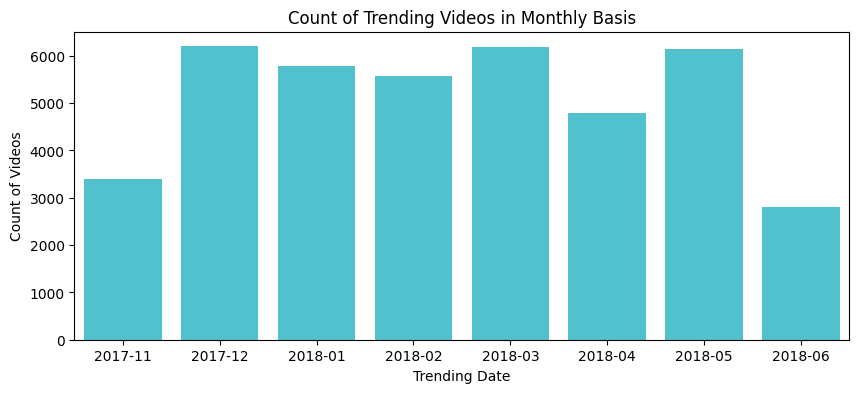

In [44]:
plt.figure(figsize=(10,4))
sns.countplot(x=df.sort_values('trending_date')['trending_date'].dt.strftime('%Y-%m'), palette=['#3DD2E3'])
plt.title('Count of Trending Videos in Monthly Basis')
plt.xlabel('Trending Date')
plt.ylabel('Count of Videos')
plt.show()

Bar chart di atas menunjukkan jumlah video yang muncul di Trending YouTube dalam skala bulanan dari November 2017 sampai Juni 2018. <br>
Jumlah video terbanyak ada di bulan Desember 2017 dan hanya berbeda tipis dengan Maret 2018 dan Mei 2018. <br><br>
>Dari visualisasi di atas saya dapat mengetahui bahwa `tidak ada batasan minimum maupun maksimum` berapa video yang bisa muncul di Trending YouTube. Ini mengacu pada jika syarat-syarat yang telah ditetapkan oleh pihak Google terpenuhi, maka berapapun jumlah videonya, semuanya akan muncul di Trending YouTube.

Sebelumnya di bagian awal, saya sudah menjabarkan `Statistika Deskriptif dari dataset`, tetapi itu masih dataset awal yang belum dibersihkan maupun ditambahkan kolom-kolomnya sesuai pernyataan masalah analisis. Saya akan menampilkannya kembali yang nantinya akan menjadi referensi penjelasan untuk variabel yang relevan di analisis selanjutnya (Analisis Konten, Analisis Reaksi, dan Analisis Waktu Unggah).

In [45]:
df.describe()

,views,likes,dislikes,comment_count,title_length,count_of_hashtags,publish_to_trending
count,4.090100e+04,4.090100e+04,4.090100e+04,4.090100e+04,40901.000000,40901.000000,40901.000000
mean,2.360678e+06,7.427173e+04,3.711722e+03,8.448567e+03,48.578617,18.720814,16.826850
std,7.397719e+06,2.289999e+05,2.904624e+04,3.745139e+04,19.621774,12.009288,146.099164
min,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00,3.000000,0.000000,0.000000
25%,2.419720e+05,5.416000e+03,2.020000e+02,6.130000e+02,34.000000,9.000000,3.000000
50%,6.810640e+05,1.806900e+04,6.300000e+02,1.855000e+03,46.000000,18.000000,5.000000
75%,1.821926e+06,5.533800e+04,1.936000e+03,5.752000e+03,61.000000,28.000000,9.000000
max,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06,100.000000,68.000000,4215.000000


Sebelum kita dapat menginterpretasikan data di atas, saya akan menghitung IQR dari setiap variabel numerik.<br>
`IQR (Interquartile Range)` adalah jarak atau rentang antara nilai kuartil 1 (Q1) dan nilai kuartil 3 (Q3) pada data yang diurutkan.<br><br>
    - Q1 adalah nilai kuartil pertama (25 persen) dari data setelah diurutkan.<br>
    - Q3 adalah nilai kuartil ketiga (75 persen) dari data setelah diurutkan.<br><br>
Dalam statistik deskriptif, IQR sering digunakan sebagai pengukuran yang lebih kokoh atau *robust* dan dapat memberikan informasi yang lebih akurat tentang variabilitas data ketika terdapat outlier atau nilai ekstrim dalam data.<br><br>
Selain itu, akan dihitung juga `Batas Minimum Bawah` dan `Batas Maksimum Atas` setiap variabel.<br>
Nilai yang berada di luar batas maksimum atas dan batas minimum bawah disebut sebagai outlier atau nilai ekstrim dan dapat disebut sebagai data yang tidak biasa atau anomali.

In [46]:
columns= df[['views', 'likes', 'dislikes', 'comment_count', 'title_length', 'count_of_hashtags', 'publish_to_trending']]

for i in columns:
    print ([i])
    Q1 = df[i].describe()['25%']
    Q3 = df[i].describe()['75%']
    min = df[i].min()
    max = df[i].max()
    IQR = Q3 - Q1
    print('IQR :', IQR, '\nMin :', min, '\nBatas minimum bawah :', Q1-(1.5*IQR), '\nMax :', max, '\nBatas maksimum atas :', Q3+(1.5*IQR),'\n')

['views']
IQR : 1579954.0 
Min : 549 
Batas minimum bawah : -2127959.0 
Max : 225211923 
Batas maksimum atas : 4191857.0 

['likes']
IQR : 49922.0 
Min : 0 
Batas minimum bawah : -69467.0 
Max : 5613827 
Batas maksimum atas : 130221.0 

['dislikes']
IQR : 1734.0 
Min : 0 
Batas minimum bawah : -2399.0 
Max : 1674420 
Batas maksimum atas : 4537.0 

['comment_count']
IQR : 5139.0 
Min : 0 
Batas minimum bawah : -7095.5 
Max : 1361580 
Batas maksimum atas : 13460.5 

['title_length']
IQR : 27.0 
Min : 3 
Batas minimum bawah : -6.5 
Max : 100 
Batas maksimum atas : 101.5 

['count_of_hashtags']
IQR : 19.0 
Min : 0 
Batas minimum bawah : -19.5 
Max : 68 
Batas maksimum atas : 56.5 

['publish_to_trending']
IQR : 6.0 
Min : 0 
Batas minimum bawah : -6.0 
Max : 4215 
Batas maksimum atas : 18.0 



Semua variabel memiliki `data minimum (min) di atas batas minimum bawah`, karena semua batas minimum bernilai minus sedangkan nilai minimum semua variabel bernilai nol. Akan tetapi, 6 dari 7 variabel memiliki `data maksimum (max) yang melebihi batas maksimum atas`. Informasi ini mengindikasikan bahwa variabel `views, likes, dislikes, comment_count, count_of_hashtags, dan publish_to_trending` memiliki **nilai ekstrim** atau yang biasa disebut *outlier*.<br><br>
Hanya variabel `title_length` yang memiliki data maksimum dibawah batas maksimum atas.

Jika variabel memiliki banyak nilai ekstrim, itu dapat menjadi tanda bahwa variabel memiliki distribusi yang sangat bervariasi atau yang biasa disebut `data diasumsikan tidak terdistribusi normal`. Untuk memvalidasi hal ini, saya akan melakukan `uji normalitas` terhadap semua variabel tersebut dengan menggunakan **boxplot**. 

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Views`')]

<IPython.core.display.Javascript object>

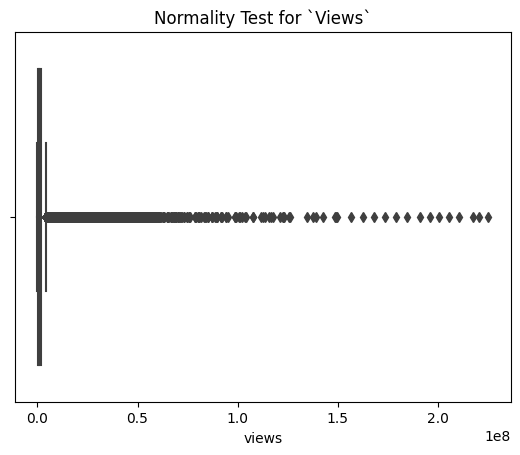

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Likes`')]

<IPython.core.display.Javascript object>

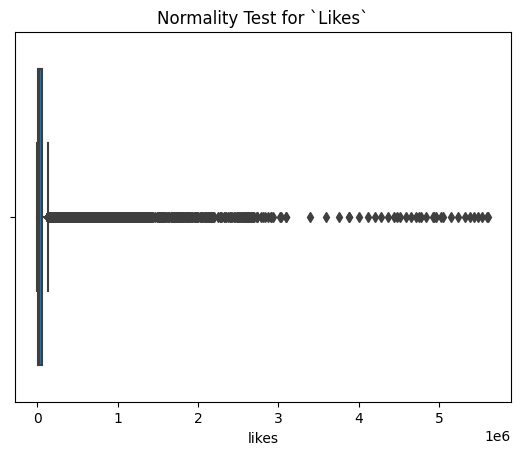

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Dislikes`')]

<IPython.core.display.Javascript object>

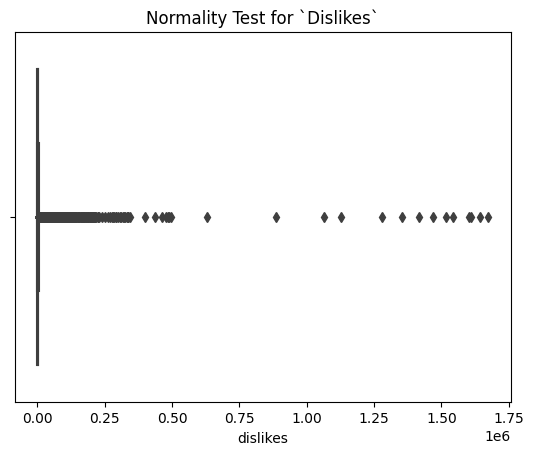

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Comment Count`')]

<IPython.core.display.Javascript object>

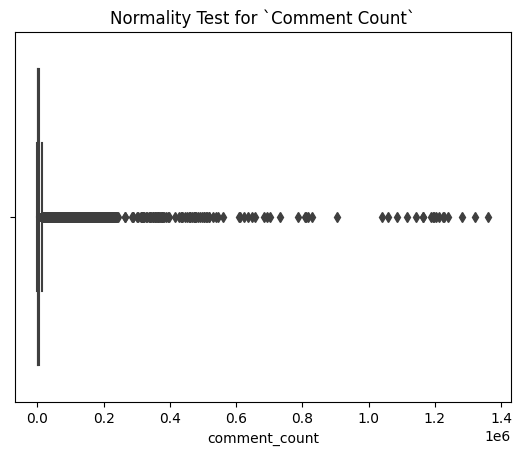

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Title Length`')]

<IPython.core.display.Javascript object>

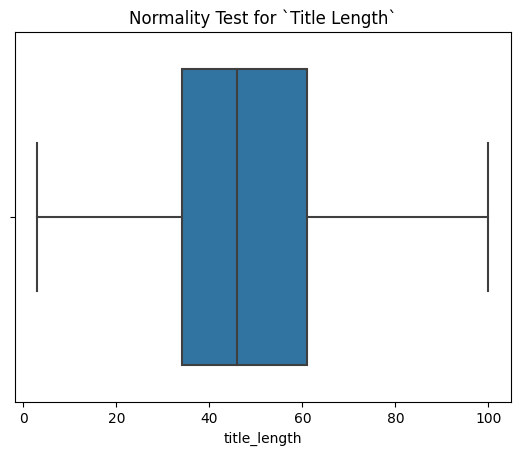

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Count of Hashtags`')]

<IPython.core.display.Javascript object>

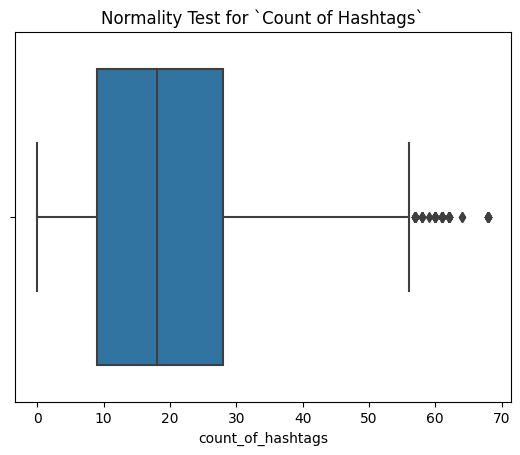

<IPython.core.display.Javascript object>

[Text(0.5, 1.0, 'Normality Test for `Interval Days from Publish to Trending`')]

<IPython.core.display.Javascript object>

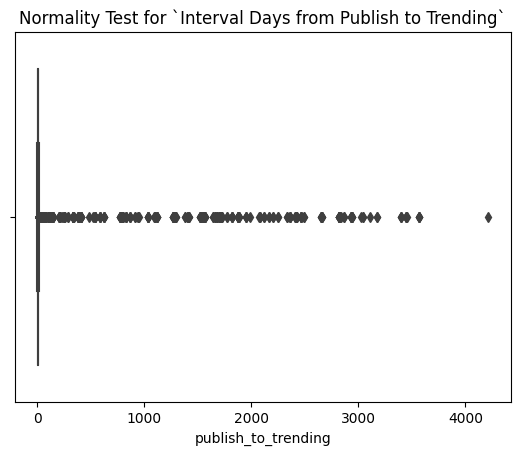

In [47]:
display(sns.boxplot(data=df, x="views").set(title = 'Normality Test for `Views`'))
plt.show()

display(sns.boxplot(data=df, x="likes").set(title='Normality Test for `Likes`'))
plt.show()

display(sns.boxplot(data=df, x="dislikes").set(title='Normality Test for `Dislikes`'))
plt.show()

display(sns.boxplot(data=df, x="comment_count").set(title='Normality Test for `Comment Count`'))
plt.show()

display(sns.boxplot(data=df, x="title_length").set(title='Normality Test for `Title Length`'))
plt.show()

display(sns.boxplot(data=df, x="count_of_hashtags").set(title='Normality Test for `Count of Hashtags`'))
plt.show()

display(sns.boxplot(data=df, x="publish_to_trending").set(title='Normality Test for `Interval Days from Publish to Trending`'))
plt.show()

Dari uji normalitas di atas, dapat dilihat bahwa 5 dari 7 variabel `views, likes, dislikes, comment_count, dan publish_to_trending`  memiliki banyak sekali data yang berada di luar batas maksimum. Untuk 5 variabel tersebut sudah dapat dipastikan bahwa data diasumsikan tidak terdistribusi normal. <br><br>
Untuk 4 variabel lainnya, `title_length` tidak memiliki data di luar batas minimum dan maksimum, sedangkan variabel `count_of_hashtags` hanya memiliki sedikit data di atas batas maksimum. Akan tetapi, semuanya diasumsikan tidak terdistribusi normal karena adanya kemiringan ke kanan atau ke kiri.<br><br>
>Dan yang pasti menjadi pertanyaan adalah banyak data di atas yang bisa dikatakan sebagai `outlier` karena berada di luar batas maksimum. Akan tetapi, jika melihat dari konteks dataset Trending YouTube ini, data-data tersebut tidak bisa dikatakan `outlier` karena ***semua variabel di atas sangat tergantung dari preferensi pembuat video, konten, maupun hype yang sedang terjadi di platform YouTube***, sehingga jika ada angka dari variabel tersebut yang signifikan lebih tinggi dibandingkan video lainnya merupakan hal yang wajar. Menurut saya, menghapus data-data tersebut justru mengurangi representasi dari dataset Trending YouTube ini.

Karena semua variabel diasumsikan tidak terdistribusi normal atau memiliki distribusi yang miring, **`Median dan IQR`** akan memberikan gambaran yang lebih akurat tentang pusat data daripada nilai `mean`. `Mean` sangat dipengaruhi oleh nilai-nilai ekstrem atau outliers pada data yang tidak terdistribusi normal, sedangkan median lebih tahan terhadap pengaruh nilai-nilai ekstrem tersebut. Oleh karena itu, akan dipaparkan juga **`Median dan IQR`** dari variabel numerik pada analisis selanjutnya.

## **2. Analisis Konten**

In [48]:
display(px.histogram(df, x='category',color = 'category', title = "Trending Category").update_xaxes(categoryorder='total descending'))
display(df[['category']].describe())

<IPython.core.display.Javascript object>

,category
count,40901
unique,16
top,Entertainment
freq,9944


Bar chart di atas menunjukkan jumlah video yang muncul di Trending YouTube berdasarkan kategori. Karena data ini adalah data kategorikal, maka yang saya akan gunakan adalah `modus`. Dapat dilihat bahwa modus dalam data ini adalah kategori `Entertainment`. <br><br>

> Dari visualisasi di atas, dapat dilihat bahwa secara keseluruhan total video, category `Entertainment` yang paling banyak muncul di Trending YouTube. Diikuti dengan kategori `Music` di posisi ke-2 dan `Howto & Style` di posisi ke-3. Kategori yang paling sedikit adalah `Nonprofits & Activism`.

In [49]:
display(px.histogram(df, x='trending_date', y='views', color='category', color_discrete_sequence=px.colors.diverging.Spectral, title = 'Total Views based on Category in Monthly Basis', category_orders= df['category']))
display(df[['views']].describe())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,views
count,4.090100e+04
mean,2.360678e+06
std,7.397719e+06
min,5.490000e+02
25%,2.419720e+05
50%,6.810640e+05
75%,1.821926e+06
max,2.252119e+08


Bar chart di atas menunjukkan dua metrics:<br>
    - total views dari semua video yang muncul di Trending YouTube dalam skala bulanan dari November 2017 sampai Juni 2018 <br>
    - total views yang di-*breakdown* secara kategori<br><br>
>Dari visualisasi di atas saya dapat mengetahui bahwa dari bulan ke bulan, relatif terjadi peningkatan total views, terutama di bulan Mei 2018 dan Juni 2018 secara signifikan. Mayoritas video ditonton kurang lebih 681 ribu penayangan dalam rentang 241 ribu sampai 1,82 juta kali.
Jika dilihat lebih detail berdasarkan kategori, fakta yang menarik bagi saya adalah di diagram `Trending Category` sebelumnya, kategori **`Entertainment`** adalah kategori yang paling tinggi dari sisi **jumlah video** yang muncul di Trending YouTube, tetapi dari **total views** dari waktu ke waktu kategori **`Sport`** yang mendominasi.

In [50]:
display(px.histogram(df, x='count_of_hashtags', title = 'Number of Videos based on Count of Hashtags', color_discrete_sequence=['goldenrod']))
display(px.histogram(df, x='count_of_hashtags', y = 'views', title = 'Total Views based on Count of Hashtags', color_discrete_sequence=['goldenrod']))
display(df[['count_of_hashtags']].describe())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,count_of_hashtags
count,40901.000000
mean,18.720814
std,12.009288
min,0.000000
25%,9.000000
50%,18.000000
75%,28.000000
max,68.000000


Bar chart pertama menunjukkan `jumlah video` berdasarkan **jumlah hashtags**.<br>
Bar chart kedua menunjukkan `total views` berdasarkan **jumlah hashtags**.<br><br>

Secara `jumlah video`, video yang tidak memiliki `hashtag` sama sekali memiliki proporsi yang paling tinggi dibandingkan `jumlah hashtags` lainnya. <br>
Tetapi menariknya, jika dilihat dari `total views`, video dengan `3 hashtags` memiliki `total views` yang paling tinggi, tetapi fakta ini tidak bisa dijadikan patokan utama.
>Dari visualisasi di atas, saya melihat fluktuasi `total views` berdasarkan `jumlah hashtags`-nya. Secara awam, memang `hashtag` meningkatkan peluang untuk memunculkan video dari kata kunci atau *keyword* yang diketik oleh pengguna YouTube. Tetapi dari data di atas, tidak ada indikasi bahwa semakin banyak hashtag, semakin tinggi pula total views. Hal ini perlu dibuktikan lebih lanjut. Secara keseluruhan, mayoritas video memiliki `kurang lebih 18 hashtags` dalam rentang `9 sampai 28 hashtags`.

In [51]:
display(px.histogram(df, x='title_length', title = 'Number of Videos based on Title Length'))
display(px.histogram(df, x='title_length', y = 'views', title = 'Total Views based on Title Length'))
display(df[['title_length']].describe())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,title_length
count,40901.000000
mean,48.578617
std,19.621774
min,3.000000
25%,34.000000
50%,46.000000
75%,61.000000
max,100.000000


Bar chart pertama menunjukkan `jumlah video` berdasarkan **jumlah karakter pada judul video**.<br>
Bar chart kedua menunjukkan `total views` berdasarkan **jumlah karakter pada judul video**.<br><br>

Secara `jumlah video`, persebaran data berdasarkan `jumlah karakter` cukup variatif. Tidak ada angka tertentu yang signifikan lebih tinggi dibandingkan `jumlah karakter` lainnya. <br>
Tetapi menariknya, jika dilihat dari `total views`, video dengan `51 karakter` memiliki `total views` yang paling tinggi dan cukup signifikan perbedaannya dibandingkan jumlah karakter lainnya, tetapi fakta ini tidak bisa dijadikan patokan utama.
>Dari data di atas, dapat dilihat bahwa mayoritas video yang muncul di Trending YouTube memiliki `kurang lebih 46 karakter` dalam rentang `34 sampai 61 karakter`. Dari kedua diagram terlihat pola yang sama yaitu data ekstrim kiri `judul dengan jumlah 0-10 karakter` dan juga `judul dengan jumlah karakter mendekati 100` sama-sama menghasilkan angka yang relatif kecil untuk `total_views` maupun `kemunculan video di Trending YouTube`. Namun, untuk melihat pengaruh antara `title_length` dengan variabel lainnya perlu dibuktikan lebih lanjut.

In [52]:
px.pie(df, names="title_all_capitalized", title='Proportion of All Capitalized Title',color_discrete_sequence = ["purple", "pink"])

<IPython.core.display.Javascript object>

Diagram pie di atas menunjukkan proporsi `jumlah video` berdasarkan **All Capitalized Title**. Seperti yang sudah diketahui secara umumnya, huruf kapital maupun kata dengan huruf semua kapital biasanya digunakan untuk menekankan sebuah pesan kepada pendengar. Dasar inilah yang membuat saya membuat variabel ini.<br>

> Hanya sebagian kecil video (6%) yang menggunakan `huruf semua kapital pada judulnya`, sebagian besar video menggunakan campuran huruf non-kapital dan huruf kapital.

## **3. Analisis Reaksi**

In [53]:
display(px.histogram(df, x='category', y = 'likes', color = 'category', title = "Trending Category based on Total Likes").update_xaxes(categoryorder='total descending'))
display(px.histogram(df, x='category', y = 'dislikes', color = 'category', title = "Trending Category based on Total Dislikes").update_xaxes(categoryorder='total descending'))
display(px.histogram(df, x='category', y = 'comment_count', color = 'category', title = "Trending Category based on Total Comments").update_xaxes(categoryorder='total descending'))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tiga *bar chart* di atas menunjukkan total `likes`, `dislikes`, dan `comments` dari semua video yang muncul di Trending YouTube berdasarkan kategori. <br><br>
>Dari visualisasi di atas yang menarik bagi saya adalah secara `views` kategori **`Music`** yang tertinggi, tapi ternyata begitu juga dengan total `dislikes`-nya. Selain itu, kategori **`Music`** juga adalah yang tertinggi dari `Total Likes` maupun `Total Dislikes`, dan juga mampu menghasilkan paling banyak `Total Komentar`. Dari sini, saya menemukan indikasi bahwa semakin tinggi total `views` video, semakin tinggi pula *engagement* yang memicu reaksi pengguna YouTube, yang dicerminkan oleh `likes`, `dislikes`, dan `comments`.

In [54]:
px.pie(df, names="comments_disabled",title='Proportion of Comments Disabled Video', color_discrete_sequence = ["purple", "pink"])

<IPython.core.display.Javascript object>

In [55]:
px.pie(df, names="ratings_disabled", title='Proportion of Ratings (Like & Dislike) Disabled Video',color_discrete_sequence = ["purple", "pink"])

<IPython.core.display.Javascript object>

Kedua diagram pie di atas menunjukkan proporsi `jumlah video` berdasarkan **Comments Disabled dan Ratings Disabled**. <br>

> Secara proporsi, hampir semua video (98%-99%) yang muncul di Trending YouTube `mengaktifkan Kolom Komentar dan mengaktifkan button Like & Dislike`. <br>

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Total Likes in Monthly Basis')

,likes
count,4.090100e+04
mean,7.427173e+04
std,2.289999e+05
min,0.000000e+00
25%,5.416000e+03
50%,1.806900e+04
75%,5.533800e+04
max,5.613827e+06


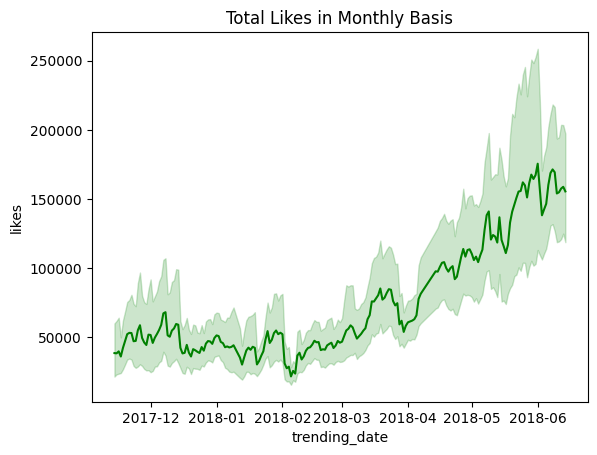

In [56]:
display(sns.lineplot(df,x='trending_date', y='likes', color = 'green').set_title('Total Likes in Monthly Basis'))
display(df[['likes']].describe())

Line chart di atas menunjukkan `jumlah likes` dalam skala bulanan.<br>

> Serupa dengan `jumlah views`, jumlah relatif meningkat secara kontinu terutama di bulan Mei 2018 dan Juni 2018. Mayoritas video memiliki `kurang lebih 18 ribu` likes dalam rentang  `5 ribu sampai 55 ribu likes`.<br>

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Total Dislikes in Monthly Basis')

,dislikes
count,4.090100e+04
mean,3.711722e+03
std,2.904624e+04
min,0.000000e+00
25%,2.020000e+02
50%,6.300000e+02
75%,1.936000e+03
max,1.674420e+06


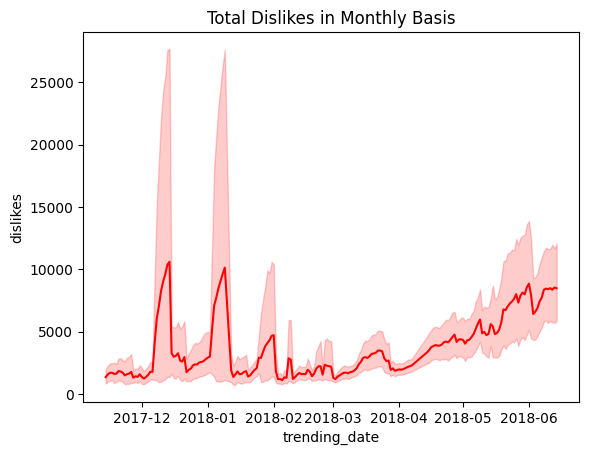

In [57]:
display(sns.lineplot(df,x='trending_date', y='dislikes', color = 'red').set_title('Total Dislikes in Monthly Basis'))
display(df[['dislikes']].describe())

Line chart di atas menunjukkan `jumlah dislikes` dalam skala bulanan.<br>

> Dari visualisasi di atas, jumlah dislikes di antara bulan Desember 2017 dan Januari 2018 adalah yang paling menonjol. Mulai dari Februari 2018 menurun sampai April 2018, tetapi meningkat kembali secara kontinu sampai Juni 2018. Mayoritas video memiliki `kurang lebih 630 likes` dalam rentang `202 sampai hampir 2000 dislikes`.

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Total Comments in Monthly Basis')

,comment_count
count,4.090100e+04
mean,8.448567e+03
std,3.745139e+04
min,0.000000e+00
25%,6.130000e+02
50%,1.855000e+03
75%,5.752000e+03
max,1.361580e+06


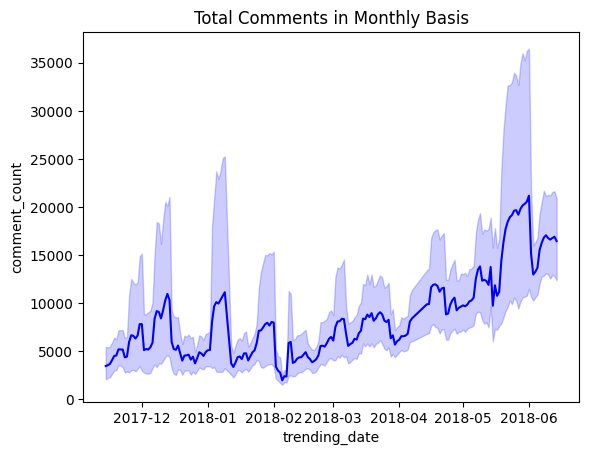

In [58]:
display(sns.lineplot(df,x='trending_date', y='comment_count', color = 'blue').set_title('Total Comments in Monthly Basis'))
display(df[['comment_count']].describe())

Line chart di atas menunjukkan `jumlah komentar` dalam skala bulanan.<br>

> Dari visualisasi di atas, jumlah komentar cukup fluktuatif sejak Desember 2017 sampai April 2018, sampai akhirnya meningkat secara kontinu dan Juni 2018 adalah yang tertinggi. Mayoritas video memiliki `kurang lebih 1.855 likes` dalam rentang `613 sampai sekitar 5.700 komentar`.

## **4. Analisis Waktu Unggah**

In [59]:
display(px.histogram(df, x= df['publish_time'].dt.day_name(), labels ={'x': ''}, title = 'Number of Videos based on Day of Video Uploaded', category_orders=dict(x=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]), color_discrete_sequence=['purple']))
display(px.histogram(df, x= df['publish_time'].dt.day_name(), labels ={'x': ''}, y='views', title = 'Total Views based on Day of Video Uploaded', category_orders=dict(x=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]), color_discrete_sequence=['purple']))
display(df[['publish_day']].describe())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,publish_day
count,40901
unique,7
top,Friday
freq,6988


Bar chart di atas menunjukkan `jumlah views` dari seluruh video di Trending YouTube berdasarkan **hari video tersebut diunggah**.<br>
Hari `Jumat` memiliki `jumlah_views` yang paling tinggi dibandingkan hari lainnya. Hari dengan `jumlah_views` paling rendah adalah hari `Sabtu`.<br><br>
>Dilihat dari modusnya, video paling banyak diunggah di hari Jumat, selaras dengan pola yang sama dari kedua visualisasi di atas. Pembuat video mayoritas mengunggah video di hari kerja tetapi kemungkinan pengguna YouTube mayoritas memutar video justru di akhir pekan. Secara awam, fakta ini wajar karena akhir pekan adalah hari libur bagi sebagian besar orang sehingga lebih memiliki banyak waktu untuk menikmati media sosial.

In [60]:
display(px.histogram(df, x=(df['publish_time']).dt.hour, labels ={'x': 'hour'}, title = 'Number of Videos based on Hour of Video Uploaded', color_discrete_sequence=['skyblue']))
display(px.histogram(df, x=(df['publish_time']).dt.hour, y='views', labels ={'x': 'hour'}, title = 'Total Views based on Hour of Video Uploaded', color_discrete_sequence=['skyblue']))
display(df[['publish_hour']].describe())


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,publish_hour
count,40901
unique,24
top,16
freq,3664


Bar chart pertama menunjukkan `jumlah video` berdasarkan **jam video tersebut diunggah**.<br>
Bar chart kedua menunjukkan `total views` dari seluruh video berdasarkan **jam video tersebut diunggah**.<br><br>

Dari semua video yang muncul di Trending YouTube, video paling banyak diunggah di `jam 4 sore` dan paling sedikit diunggah di `jam 6 pagi`.
Akan tetapi, yang menarik bagi saya adalah justru video yang diunggah saat `jam 4 pagi` memiliki `total_views` yang paling tinggi dibandingkan jam lainnya. Jam dengan `total_views` yang paling rendah adalah `jam 6 pagi`. Akan tetapi kembali lagi, fakta ini tidak bisa dijadikan patokan utama.<br><br>
>Sama seperti visualisasi sebelumnya mengenai pengunggahan video berdasarkan hari, pada visualisasi berdasarkan jam ini saya menemukan pola yang sama dari kedua grafik di atas. Secara modus, video paling banyak diunggah di jam `4 sore`.

In [61]:
display(px.histogram(df, x='publish_to_trending', title = 'Total Videos based on Interval Days from Publish to Trending'))
display(df[['publish_to_trending']].describe())

<IPython.core.display.Javascript object>

,publish_to_trending
count,40901.000000
mean,16.826850
std,146.099164
min,0.000000
25%,3.000000
50%,5.000000
75%,9.000000
max,4215.000000


Bar chart pertama menunjukkan `jumlah video` berdasarkan **interval hari dari video diunggah sampai muncul di Trending YouTube**. <br>

Hal yang menarik dari visualisasi di atas adalah ada video yang membutuhkan waktu sampai `4000 hari` untuk muncul di Trending YouTube. Akan tetapi, dapat dilihat bahwa jumlah video yang muncul di atas `500 hari` itu sangat sedikit. Terbukti dengan statistika deskriptif di atas bahwa mayoritas video muncul di Trending YouTube kurang lebih `5 hari` sejak video diunggah, dalam rentang `3 sampai 9 hari`. <br>

Kembali mengacu pada **pernyataan masalah** dalam analisis ini bahwa tujuan yang ingin dicapai adalah `video muncul di Trending YouTube paling lambat 90 hari sejak video diunggah`, maka saya akan menampilkan rentang antara `0 sampai 90 hari` saja.

In [62]:
px.histogram(df[df['publish_to_trending'] <= 90], x = 'publish_to_trending', title = 'Total Videos based on Interval Days from Publish to Trending')

<IPython.core.display.Javascript object>

>Dari visualisasi di atas terlihat persebaran paling banyak ada di `0 sampai 30 hari`. Fakta ini menunjukkan bahwa memunculkan video di Trending YouTube dalam waktu 3 bulan (90 hari) sejak video diunggah adalah target yang cukup realistis.

# **Jawaban Pernyataan Masalah**

Dengan pemaparan di atas saya sudah bisa menjawab pertanyaan nomor 1:

## **1. Bagaimana gambaran umum mengenai Trending YouTube secara keseluruhan maupun secara periodik?**

- Secara keseluruhan, video yang paling banyak muncul di Trending YouTube adalah kategori Entertainment. <br>
- Jika dilihat dalam skala bulanan, jumlah video yang muncul di Trending YouTube variatif. Ini mengindikasikan bahwa tidak ada minimum atau maksimum jumlah video yang bisa muncul di Trending YouTube.<br>
- Dari jumlah views, justru kategori Music adalah kategori yang mendominasi dari keseluruhan video.<br>
- Jumlah views semua video dari waktu ke waktu selalu meningkat. Terutama di bulan Mei 2018 dan Juni 2018, angka total views signifikan meningkat dari bulan-bulan sebelumnya.<br>
- Selaras dengan jumlah views, ternyata kategori Music memiliki jumlah likes dan jumlah comments yang paling tinggi juga. Menariknya, ternyata kategori Music pun adalah kategori yang jumlah dislikes-nya paling tinggi. Ini mengindikasikan bahwa semakin banyak jumlah views, berpotensi semakin tinggi pula reaction dari pada pengguna YouTube dengan comments, likes, maupun dislikes.<br>
- Mayoritas video memiliki kurang lebih 681 ribu penayangan dalam rentang 241 ribu sampai 1,82 juta total views.<br>
- Mayoritas video memiliki kurang lebih 18 ribu likes dalam rentang 5 ribu sampai 55 ribu likes.<br>
- Mayoritas video memiliki kurang lebih 630 likes dalam rentang 202 sampai 1936 dislikes.<br>
- Mayoritas video memiliki 1855 komentar dalam rentang 613 sampai 5752 komentar.<br>
- Secara proporsi, hampir semua video yang muncul di Trending YouTube (98%-99%) mengaktifkan kolom komentar dan mengaktifkan Like & Dislikes.<br>
- Berdasarkan panjang karakter dalam judul, mayoritas video memiliki judul dengan jumlah 46 karakter dalam rentang 34-61 karakter.<br>
- Hanya ada sebagian kecil video (6%) dengan judul video menggunakan huruf kapital semua. Mayoritas video memiliki judul dengan campuran kapital dan non-kapital.<br>
- Mayoritas video menggunakan kurang lebih 18 hashtags dalam rentang 9 sampai 28 hashtags.<br>
- Berdasarkan hari, video paling banyak diunggah di hari Jumat. Berdasarkan jam, video paling banyak diunggah di jam 4 sore.<br>
- Mayoritas video muncul di Trending YouTube kurang lebih 5 hari dalam rentang 3 sampai 9 hari sejak video diunggah. <br>

In [63]:
df.describe()

,views,likes,dislikes,comment_count,title_length,count_of_hashtags,publish_to_trending
count,4.090100e+04,4.090100e+04,4.090100e+04,4.090100e+04,40901.000000,40901.000000,40901.000000
mean,2.360678e+06,7.427173e+04,3.711722e+03,8.448567e+03,48.578617,18.720814,16.826850
std,7.397719e+06,2.289999e+05,2.904624e+04,3.745139e+04,19.621774,12.009288,146.099164
min,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00,3.000000,0.000000,0.000000
25%,2.419720e+05,5.416000e+03,2.020000e+02,6.130000e+02,34.000000,9.000000,3.000000
50%,6.810640e+05,1.806900e+04,6.300000e+02,1.855000e+03,46.000000,18.000000,5.000000
75%,1.821926e+06,5.533800e+04,1.936000e+03,5.752000e+03,61.000000,28.000000,9.000000
max,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06,100.000000,68.000000,4215.000000


Menyambung ke pertanyaan kedua:

> **Apa saja metrics yang harus diperhatikan untuk mengoptimalkan peluang video muncul di Trending YouTube?**

Gambaran umum di atas mencerminkan representasi dari data tetapi tidak bisa serta merta menjadi patokan utama. <br> <br>
Oleh karena itu, untuk menjawab pertanyaan masalah kedua saya harus mencari variabel-variabel yang penting terkait video yang muncul di Trending YouTube, langkah-langkah yang akan saya lakukan: <br><br>
>1. Melakukan uji normalitas <br>
>2. Melakukan uji korelasi yang tepat digunakan berdasarkan hasil uji normalitas <br>

`1. Uji Normalitas`

Uji normalitas sudah dilakukan sebelumnya dan **seluruh variabel diasumsikan tidak terdistribusi normal**.

`2. Uji Korelasi`

Selanjutnya, saya akan melakukan uji korelasi terhadap variabel yang sudah saya uji normalitasnya. <br>
Karena seluruh variabel diasumsikan tidak terdistribusi normal, saya akan menggunakan `Uji Korelasi Spearman`.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

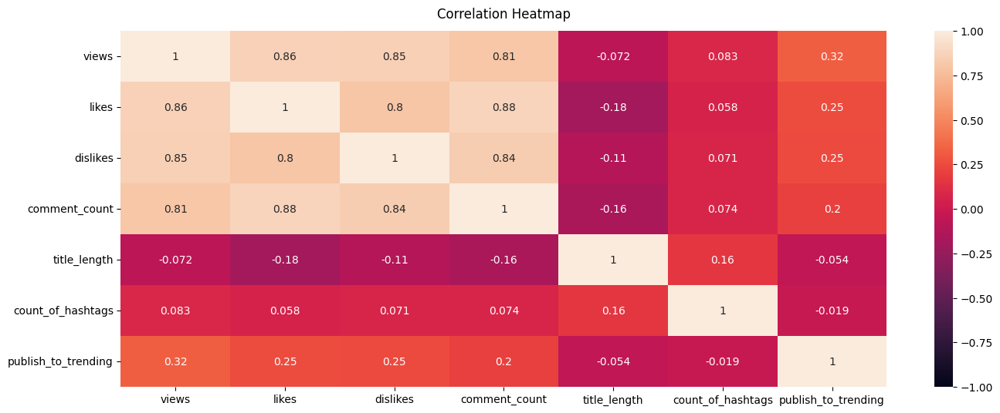

In [65]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df[['views', 'likes', 'dislikes', 'comment_count', 'title_length', 'count_of_hashtags', 'publish_to_trending']].corr(method = 'spearman'), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

Dari uji korelasi di atas, saya akan menggunakan kategori rentang di bawah ini:

-Rentang 0.00-0.19: Korelasi sangat lemah <br>
-Rentang 0.20-0.39: Korelasi lemah<br>
-Rentang 0.40-0.59: Korelasi sedang<br>
-Rentang 0.60-0.79: Korelasi kuat<br>
-Rentang 0.80-1.00: Korelasi sangat kuat<br>

Berdasarkan norma tersebut, informasi yang saya dapatkan antara lain: <br><br>
>- Variabel `views`, `likes, dislikes`, dan `comment_count` **berkorelasi positif sangat kuat antara satu sama lain**. <br><br>
>- Variabel `publish_to_trending` **berkorelasi positif (tetapi lemah)** dengan variabel `views`, `likes, dislikes, dan comment_count`.<br><br>
>- Variabel `title_length, count_of_hashtags` dapat disimpulkan **tidak berkorelasi dengan variabel apapun**.<br>

## **2. Apa saja variabel yang harus diperhatikan untuk mengoptimalkan peluang video muncul di Trending YouTube?**


> **`- Views`** <br>
> **`- Likes`**<br>
> **`- Dislikes`** `(dengan catatan)`<br>
> **`- Comment Count`**

Penjelasan:

`Views` dapat disimpulkan menjadi variabel yang paling penting di antara variabel lainnya karena memutar video adalah langkah pertama yang harus pengguna YouTube lakukan sebelum memberikan *reaction* terhadap video. Dengan pembuktian bahwa `views, jumlah komentar, jumlah likes dan dislikes` berkorelasi sangat kuat antara satu sama lain, hal ini menunjukkan bahwa meningkatnya satu variabel berpotensi meningkatkan variabel lainnya.<br><br>Ada catatan penting bahwa variabel `dislikes` berkorelasi kuat pula dengan variabel lainnya tetapi variabel ini bukanlah variabel yang "baik" pada suatu video, sehingga meningkatkan `dislikes` untuk meningkatkan `views, likes, dan jumlah komentar` bukanlah hal yang tepat untuk dilakukan.<br><br>

`Jumlah karakter pada judul, dan jumlah hashtags` tidak berkorelasi dengan variabel apapun, tetapi bisa dikaitkan dengan pusat data yaitu **IQR dan median** yang dapat merepresentasikan variabel-variabel tersebut. 

## **3. Apa saja *insights* dan *actionable recommendations* yang didapatkan dari analisis ini?**


Kesimpulan dari hasil dari analisis sekaligus rekomendasi  yang akan saya sampaikan kepada Direktur Marketing dan Tim Creative, antara lain:

> - Buatlah konten dengan jangkauan `segmentasi yang luas` sehingga meningkatkan potensi video tersebut ditonton oleh banyak pengguna. <br>
Semakin banyak video diputar *(views)*, semakin tinggi pula potensi untuk banyaknya likes dan komentar. Banyaknya *reaction* seperti likes dan komentar itu kembali lagi meningkatkan potensi video diputar kembali maupun menjangkau pengguna YouTube lainnya sehingga views pun akan semakin meningkat.<br>
> - Buatlah target segmentasi luas yang menjangkau `beberapa rentang usia`, misalnya usia remaja sampai usia tua. Jika video relevan dengan berbagai rentang usia, potensi jumlah pengguna YouTube yang akan menonton pun semakin meningkat.<br>
> - Konten harus berhasil menstimulasi pengguna untuk `menulis di kolom komentar`, misalnya dengan kuis, menanyakan opini/preferensi, meminta pengguna untuk menceritakan kisahnya dalam investasi, atau lainnya.<br>
> - Selalu balas komentar dalam video, karena selain meningkatkan `jumlah komentar`, minimal pengguna YouTube yang menulis komentar tersebut akan kembali ke video untuk melihat balasan yang berpotensi untuk memutar kembali video. Dengan semakin banyaknya komentar, akan semakin besar juga potensi peningkatan `jumlah views`. <br>
> - Mengingat dua kategori utama yaitu `Entertainment` dan `Music` yang secara signifikan mendominasi baik secara jumlah video maupun jumlah views, buatlah bumbu-bumbu hiburan dalam konten dan pemutaran musik sebagai *backsound*.
> - Menonaktifkan kolom komentar dan button *like* & *dislike* tidak disarankan, mengingat `total views, jumlah likes, dan jumlah komentar` saling mempengaruhi secara kuat antara satu sama lain.<br> 
> - Variabel `dislikes` berkorelasi kuat pula dengan variabel lainnya tetapi variabel ini bukanlah variabel yang "baik" pada suatu video, sehingga meningkatkan `dislikes` untuk meningkatkan `views, likes, dan jumlah komentar` bukanlah hal yang tepat untuk dilakukan. <br>
> - `Jumlah karakter` tidak berkorelasi dengan apapun, tetapi jika melihat pusat data, mayoritas video memiliki judul dengan kurang lebih `46 karakter` dalam rentang `34 sampai 61 karakter`. Judul sebaiknya tidak terlalu panjang sehingga judul dapat terlihat semua.
> - Penggunaan huruf semua kapital maupun nonkapital pada judul dibebaskan, disesuaikan saja dengan kontennya. Buatlah *copy writing* pada judul yang menarik bagi pengguna YouTube agar tertarik untuk mengklik dan memutar video tersebut sehingga menghasilkan `views`.<br>
> - Penggunaan hashtags dan `jumlah hashtags` tidak berkorelasi dengan variabel apapun. Mayoritas video memiliki `18 hashtags` dalam rentang `9 sampai 28 hashtags`. Buatlah  hashtag-hashtag yang relevan dengan video, karena ketika pengguna mengetik *keyword* dan menganggap video relevan dengan apa yang ia cari, ini akan mendorong *reaction* positif dari pengguna YouTube seperti Likes dan Komentar, yang akan kembali *looping* menghasilkan `jumlah views` yang lebih banyak.
> - Untuk `hari dan jam pengunggahan video`, referensi bisa mengacu pada modus. Video paling banyak diunggah di `hari Jumat`. Untuk jam, video paling banyak diunggah di `jam 4 sore`. Selaras dengan pola berdasarkan jumlah video maupun jumlah views, yang paling tinggi adalah hari Jumat. Mengingat secara umum, mayoritas orang memiliki banyak waktu luang di akhir pekan (Sabtu dan Minggu) karena hari libur. Cara ini dapat mengoptimalkan video menghasilkan banyak views dalam waktu yang relatif singkat sehingga meningkatkan peluang muncul di Trending YouTube. <br>
> - Semakin lama rentang waktu dari video diunggah belum tentu masih menghasilkan `views, likes, dan komentar` yang lebih banyak pula. Oleh karena itu, kejar views maupun *reaction* positif pada video secepat mungkin. Data membuktikan bahwa mayoritas video muncul di Trending kurang lebih `5 hari` setelah video diunggah, di `antara 3 sampai 9 hari`. Secara keseluruhan, video-video muncul di Trending YouTube dengan rentang 0 sampai 30 hari sejak video diunggah, sehingga butuh perhatian khusus pada 30 hari pertama, terutama di 9 hari pertama, untuk menghasilkan views, likes, dan komentar.<br>
> - Pernyataan resmi dari pihak Google mengenai pertimbangan-pertimbangan bagaimana video bisa muncul di Trending YouTube ada di tautan ini *https://support.google.com/youtube/answer/7239739?hl=en* untuk menjadi tambahan referensi untuk membuat konten.